In [1]:
import pandas as pd
import numpy as np
import datetime

# --- Configuration ---
NUM_CUSTOMERS = 1500
NUM_PRODUCTS = 10
NUM_TRANSACTIONS = 10000
START_DATE = datetime.date(2023, 1, 1)
END_DATE = datetime.date(2025, 9, 15)

# --- Data Dictionaries ---
products = {
    'product_id': [f'QG{101+i}' for i in range(NUM_PRODUCTS)],
    'product_name': ['ChronoLeap Watch', 'NeuroSync VR', 'HoloDeck Projector', 'Quantum Entangler',
                     'Bio-Harmonizer', 'Stellar Drone', 'EchoSphere Speaker', 'Plasma Scribe Pen',
                     'Stealth Drive', 'Gravity Boots'],
    'category': ['Wearables', 'Entertainment', 'Home', 'Communication',
                 'Health', 'Hobbies', 'Home', 'Office',
                 'Storage', 'Wearables'],
    'base_price': [499, 899, 1299, 2499, 349, 799, 199, 149, 299, 999]
}
products_df = pd.DataFrame(products)

customers = {
    'customer_id': [1001 + i for i in range(NUM_CUSTOMERS)],
    'age': np.random.randint(18, 70, size=NUM_CUSTOMERS),
    'gender': np.random.choice(['Male', 'Female', 'Non-binary'], size=NUM_CUSTOMERS, p=[0.48, 0.48, 0.04]),
    'location': np.random.choice(['New York', 'Los Angeles', 'Chicago', 'Houston', 'Phoenix',
                                 'London', 'Tokyo', 'Paris', 'Sydney', 'Dubai'],
                                 size=NUM_CUSTOMERS, p=[0.2, 0.15, 0.1, 0.08, 0.07, 0.1, 0.1, 0.08, 0.07, 0.05]),
    'join_date': [START_DATE + datetime.timedelta(days=np.random.randint(0, (END_DATE - START_DATE).days)) for _ in range(NUM_CUSTOMERS)]
}
customers_df = pd.DataFrame(customers)

# --- Generate Transactions ---
transactions = []
date_range = (END_DATE - START_DATE).days
for _ in range(NUM_TRANSACTIONS):
    # Select customer and product
    cust_id = np.random.choice(customers_df['customer_id'])
    prod_id = np.random.choice(products_df['product_id'])
    
    # Generate date with seasonality (more sales in Q4)
    month = np.random.choice(range(1, 13), p=[0.07, 0.07, 0.07, 0.08, 0.08, 0.08, 0.08, 0.09, 0.09, 0.11, 0.1, 0.08])
    day = np.random.randint(1, 29)
    year = np.random.randint(2023, 2026)
    try:
        transaction_date = datetime.date(year, month, day)
    except ValueError:
        transaction_date = datetime.date(year, month, 28)

    if transaction_date < START_DATE or transaction_date > END_DATE:
        continue
        
    # Generate other metrics
    quantity = np.random.choice([1, 2, 3], p=[0.9, 0.08, 0.02])
    rating = max(1, min(5, np.random.normal(4.2, 0.8))) # Ratings tend to be high
    
    transactions.append({
        'transaction_id': f'T{20001+_}',
        'customer_id': cust_id,
        'product_id': prod_id,
        'quantity': quantity,
        'transaction_date': transaction_date,
        'customer_rating': round(rating, 1)
    })

transactions_df = pd.DataFrame(transactions)

# --- Merge into a single DataFrame ---
df = pd.merge(transactions_df, customers_df, on='customer_id')
df = pd.merge(df, products_df, on='product_id')

# Calculate total sales
df['total_sale'] = df['quantity'] * df['base_price']
df['transaction_date'] = pd.to_datetime(df['transaction_date'])

print("Synthetic data generated successfully!")
print(f"DataFrame shape: {df.shape}")
df.head()

Synthetic data generated successfully!
DataFrame shape: (8900, 14)


,transaction_id,customer_id,product_id,quantity,transaction_date,customer_rating,age,gender,location,join_date,product_name,category,base_price,total_sale
0,T20001,1536,QG110,1,2023-10-21,5.0,47,Male,Phoenix,2023-02-16,Gravity Boots,Wearables,999,999
1,T21413,1536,QG110,1,2023-04-27,3.5,47,Male,Phoenix,2023-02-16,Gravity Boots,Wearables,999,999
2,T24650,1750,QG110,1,2023-02-06,3.1,61,Female,Paris,2023-03-14,Gravity Boots,Wearables,999,999
3,T23193,1882,QG110,1,2024-02-21,4.1,62,Female,Phoenix,2025-08-19,Gravity Boots,Wearables,999,999
4,T28144,1607,QG110,1,2024-10-16,2.4,36,Male,Houston,2023-09-27,Gravity Boots,Wearables,999,999


In [2]:
#Distribution and Correlation Analysis
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Set plotting styles
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

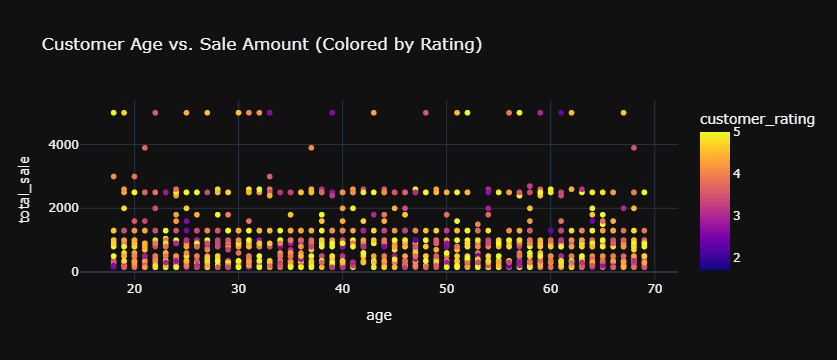

In [3]:
# A simple scatter plot can be transformed
fig = px.scatter(
    df.sample(2000), # Sample for better performance
    x='age',
    y='total_sale',
    color='customer_rating',                    # Color each point by its rating
    color_continuous_scale=px.colors.sequential.Plasma, # Choose a vibrant color scale
    template='plotly_dark',                     # Use a sleek dark theme
    title='Customer Age vs. Sale Amount (Colored by Rating)'
)
fig.show()

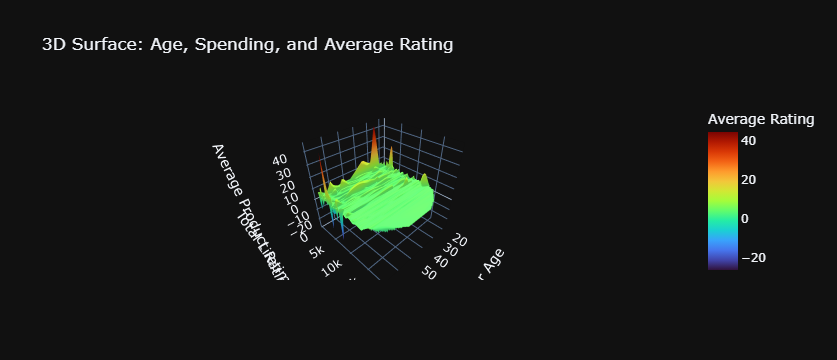

In [10]:

#3D Surface Plot of Customer Behavior
import plotly.graph_objects as go
from scipy.interpolate import griddata

# Prepare data for the 3D surface
customer_summary = df.groupby('customer_id').agg(
    total_spent=('total_sale', 'sum'),
    avg_rating=('customer_rating', 'mean'),
    age=('age', 'first')
).reset_index()

# Create a grid for interpolation
x = customer_summary['age']
y = customer_summary['total_spent']
z = customer_summary['avg_rating']
xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)
zi = griddata((x, y), z, (xi[None,:], yi[:,None]), method='cubic')

# Create the 3D surface plot
fig = go.Figure(data=[go.Surface(
    z=zi,
    x=xi,
    y=yi,
    colorscale='Turbo',
    colorbar=dict(title='Average Rating')
)])

fig.update_layout(
    title='3D Surface: Age, Spending, and Average Rating',
    scene=dict(
        xaxis_title='Customer Age',
        yaxis_title='Total Lifetime Spending ($)',
        zaxis_title='Average Product Rating'),
    template='plotly_dark'
)
#fig.show()

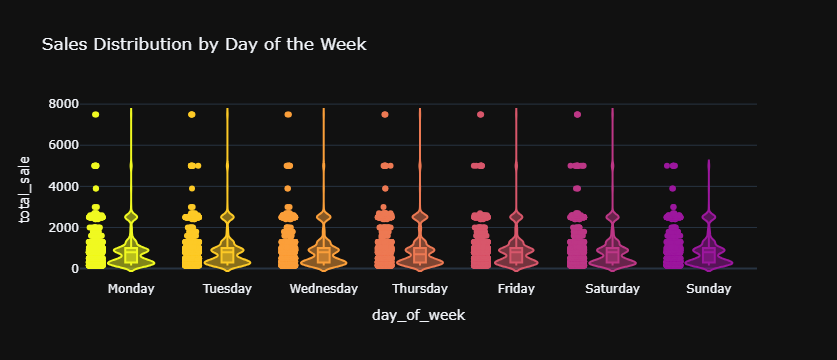

In [11]:

#Violin Plot with Data Points
import plotly.express as px

# Order the days of the week correctly
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
df['day_of_week'] = pd.Categorical(df['transaction_date'].dt.day_name(), categories=day_order, ordered=True)

fig = px.violin(
    df.sort_values('day_of_week'),
    x='day_of_week',
    y='total_sale',
    color='day_of_week',
    box=True,
    points='all',  # You can use 'outliers' or False for less clutter
    hover_data=['product_name', 'customer_rating'],
    title='Sales Distribution by Day of the Week',
    template='plotly_dark',
    color_discrete_sequence=px.colors.sequential.Plasma_r # Use a vibrant reversed palette
)
fig.update_layout(showlegend=False)
fig.show()

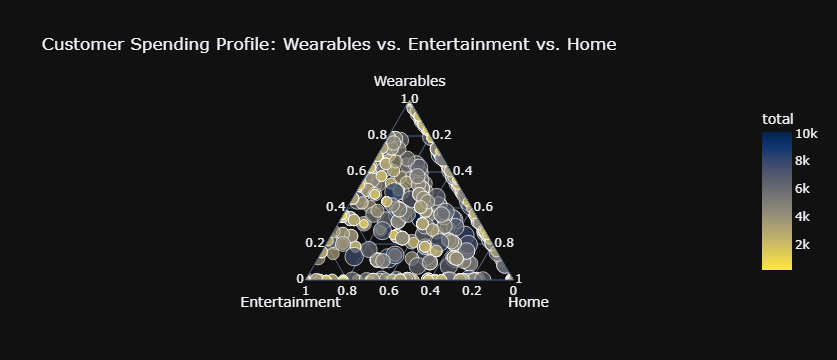

In [13]:
#Ternary Plot for Category Spending Mix
# Engineer data for the ternary plot
category_sales = df.groupby(['customer_id', 'category'])['total_sale'].sum().unstack(fill_value=0)
major_categories = ['Wearables', 'Entertainment', 'Home']
category_sales = category_sales[major_categories]
category_sales['total'] = category_sales.sum(axis=1)

# Filter out customers who haven't bought from these categories
category_sales = category_sales[category_sales['total'] > 0]

# Create the ternary plot
fig = px.scatter_ternary(
    category_sales,
    a="Wearables",
    b="Entertainment",
    c="Home",
    color="total",
    size="total",
    size_max=15,
    color_continuous_scale=px.colors.sequential.Cividis_r,
    title="Customer Spending Profile: Wearables vs. Entertainment vs. Home",
    template="plotly_dark"
)
fig.show()

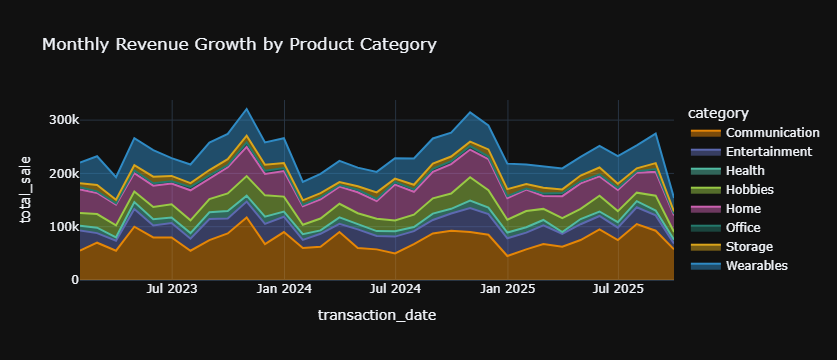

In [14]:
#Stacked Area Chart of Revenue by Category
# Aggregate data by month and category
monthly_category_sales = df.groupby([pd.Grouper(key='transaction_date', freq='M'), 'category'])['total_sale'].sum().reset_index()

fig = px.area(
    monthly_category_sales,
    x='transaction_date',
    y='total_sale',
    color='category',
    line_group='category',
    title='Monthly Revenue Growth by Product Category',
    template='plotly_dark',
    color_discrete_sequence=px.colors.qualitative.Vivid
)
fig.show()

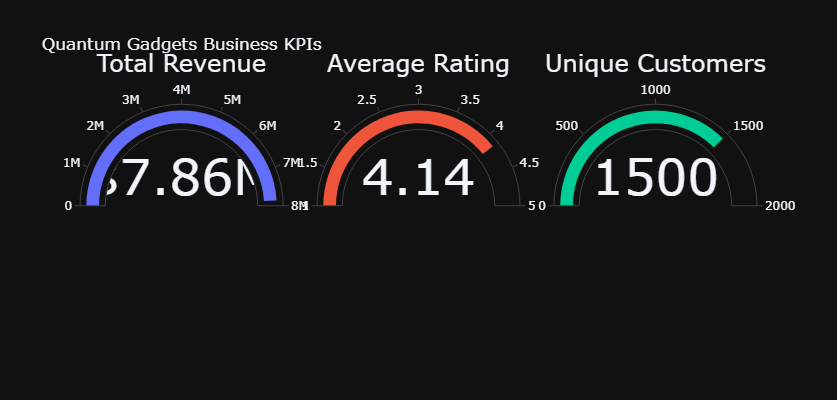

In [16]:
#Dashboard-Style Indicator Gauges\
# Calculate KPIs
total_revenue = df['total_sale'].sum()
avg_rating = df['customer_rating'].mean()
unique_customers = df['customer_id'].nunique()

fig = go.Figure()

fig.add_trace(go.Indicator(
    mode="number+gauge",
    value=total_revenue,
    number={'prefix': "$", 'font': {'size': 50}},
    title={'text': "Total Revenue", 'font': {'size': 24}},
    domain={'x': [0, 0.3], 'y': [0.5, 1]},
    gauge={'axis': {'range': [None, 8000000]}, 'bar': {'color': "#636EFA"}}
))

fig.add_trace(go.Indicator(
    mode="number+gauge",
    value=avg_rating,
    number={'valueformat': '.2f', 'font': {'size': 50}},
    title={'text': "Average Rating", 'font': {'size': 24}},
    domain={'x': [0.35, 0.65], 'y': [0.5, 1]},
    gauge={'axis': {'range': [1, 5]}, 'bar': {'color': "#EF553B"}}
))

fig.add_trace(go.Indicator(
    mode="number+gauge",
    value=unique_customers,
    number={'font': {'size': 50}},
    title={'text': "Unique Customers", 'font': {'size': 24}},
    domain={'x': [0.7, 1], 'y': [0.5, 1]},
    gauge={'axis': {'range': [None, 2000]}, 'bar': {'color': "#00CC96"}}
))

fig.update_layout(
    title="Quantum Gadgets Business KPIs",
    template='plotly_dark',
    height=400
)
fig.show()

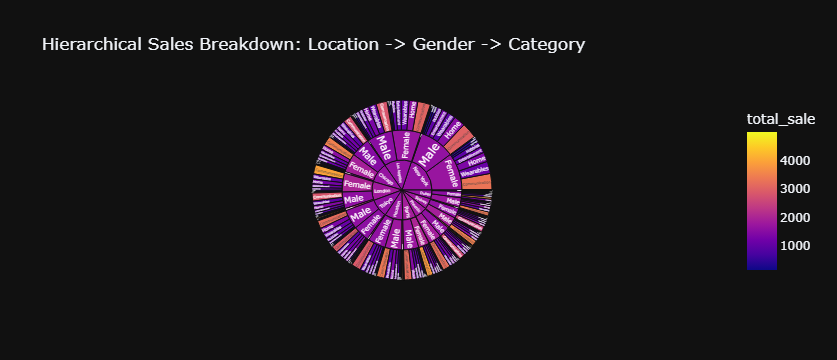

In [17]:
#Multi-Level Sunburst Chart
fig = px.sunburst(
    df,
    path=['location', 'gender', 'category'],
    values='total_sale',
    color='total_sale',
    color_continuous_scale='Plasma',
    title='Hierarchical Sales Breakdown: Location -> Gender -> Category',
    template='plotly_dark'
)
fig.show()

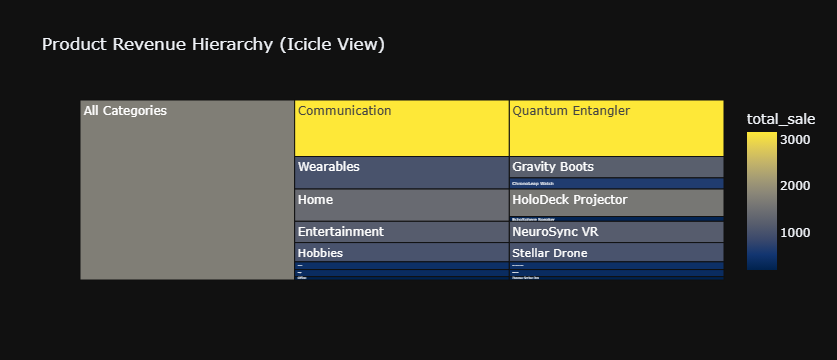

In [19]:
#Icicle Chart for Product Hierarchy
fig = px.icicle(
    df,
    path=[px.Constant("All Categories"), 'category', 'product_name'],
    values='total_sale',
    color='total_sale',
    color_continuous_scale='Cividis',
    title='Product Revenue Hierarchy (Icicle View)',
    template='plotly_dark'
)
fig.update_traces(root_color="lightgrey")
fig.show()

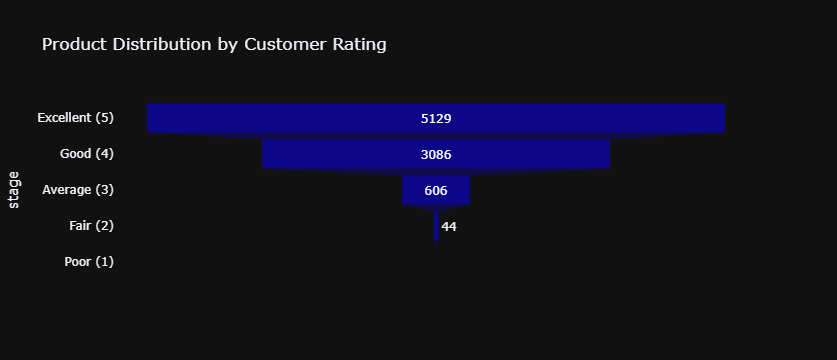

In [20]:
#Funnel Chart with Sales Data
# Create rating bins
bins = [0, 1, 2, 3, 4, 5]
labels = ['Poor (1)', 'Fair (2)', 'Average (3)', 'Good (4)', 'Excellent (5)']
df['rating_tier'] = pd.cut(df['customer_rating'], bins=bins, labels=labels, right=True, include_lowest=True)

# Count products in each tier
funnel_data = df['rating_tier'].value_counts().reset_index()
funnel_data.columns = ['stage', 'values']

fig = px.funnel(
    funnel_data.sort_values('values', ascending=False),
    x='values',
    y='stage',
    title='Product Distribution by Customer Rating',
    template='plotly_dark',
    color_discrete_sequence=px.colors.sequential.Plasma
)
fig.show()

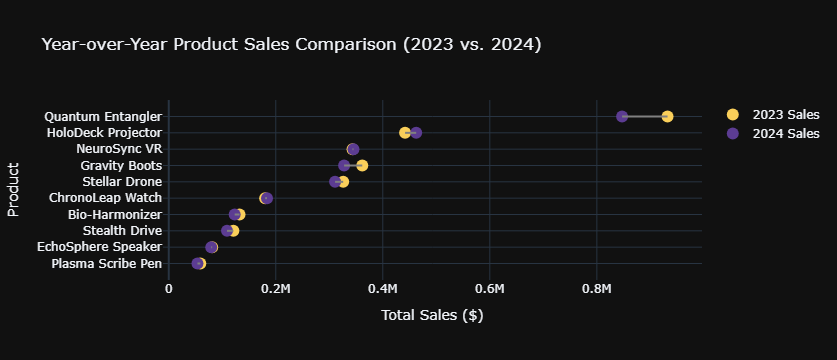

In [22]:
#Dumbbell Plot for Year-over-Year Sales Comparison
import plotly.express as px
import plotly.graph_objects as go

# Prepare data
sales_by_year = df[df['transaction_date'].dt.year.isin([2023, 2024])]
product_sales_yoy = sales_by_year.groupby(['product_name', df.transaction_date.dt.year])['total_sale'].sum().unstack(fill_value=0)
product_sales_yoy.columns = ['sales_2023', 'sales_2024']
product_sales_yoy = product_sales_yoy.sort_values('sales_2024', ascending=True)

# Create the plot
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=product_sales_yoy['sales_2023'], y=product_sales_yoy.index,
    name='2023 Sales', mode='markers',
    marker=dict(color='#FACF5A', size=12)
))
fig.add_trace(go.Scatter(
    x=product_sales_yoy['sales_2024'], y=product_sales_yoy.index,
    name='2024 Sales', mode='markers',
    marker=dict(color='#5C3C92', size=12)
))

# Add the "dumbbell" lines
for i, product in enumerate(product_sales_yoy.index):
    fig.add_shape(type="line",
        x0=product_sales_yoy.loc[product, 'sales_2023'], y0=i,
        x1=product_sales_yoy.loc[product, 'sales_2024'], y1=i,
        line=dict(color="grey", width=2)
    )

fig.update_layout(
    title='Year-over-Year Product Sales Comparison (2023 vs. 2024)',
    xaxis_title='Total Sales ($)', yaxis_title='Product',
    template='plotly_dark'
)
fig.show()

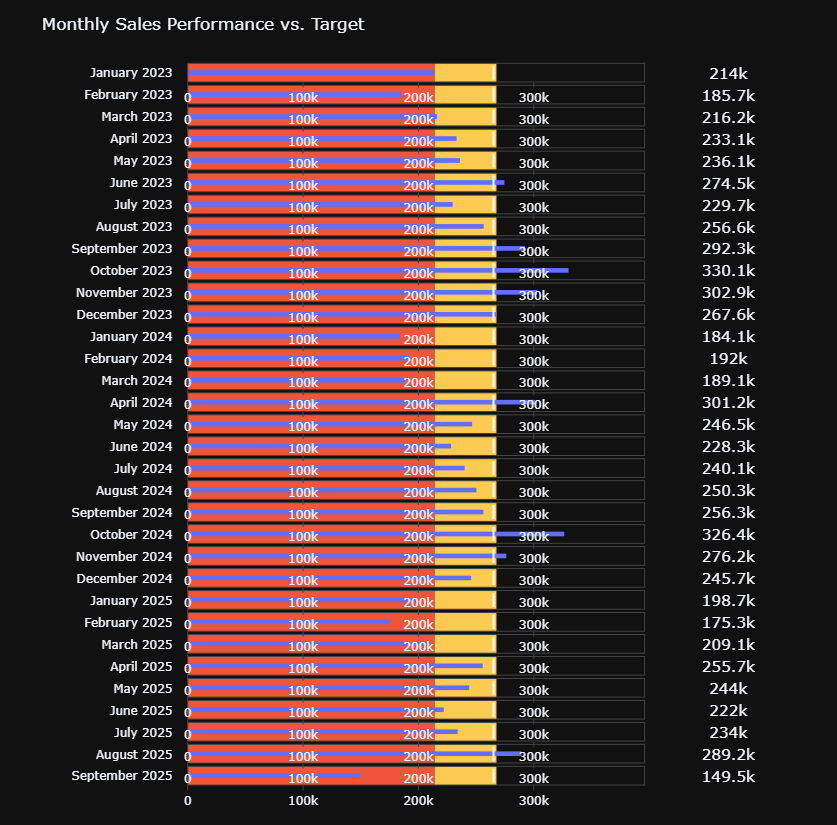

In [6]:
#Bullet Charts

import plotly.graph_objects as go

# 1. Prepare data
monthly_sales = df.set_index('transaction_date')['total_sale'].resample('M').sum()
monthly_sales = monthly_sales.to_frame(name='sales')
monthly_sales['target'] = monthly_sales['sales'].mean() * 1.1 # Set a target 10% above average
monthly_sales['month'] = monthly_sales.index.strftime('%B %Y')
monthly_sales = monthly_sales.sort_index(ascending=False) # Display latest month at the top

# 2. Create the figure
fig = go.Figure()
n_months = len(monthly_sales)

# 3. Loop through months and calculate domain correctly
for i, (index, row) in enumerate(monthly_sales.iterrows()):
    # Calculate each chart's vertical slot to be between 0 and 1
    y_start = i / n_months
    y_end = (i + 0.85) / n_months # Use 0.85 to create a small gap between charts

    fig.add_trace(go.Indicator(
        mode="number+gauge",
        value=int(row['sales']),
        domain={'x': [0.1, 1], 'y': [y_start, y_end]}, # Use the corrected domain
        title={'text': row['month'], 'font': {'size': 12}},
        gauge={
            'shape': "bullet",
            'axis': {'range': [None, monthly_sales['sales'].max()*1.2]},
            'threshold': {
                'line': {'color': "white", 'width': 2},
                'thickness': 0.75,
                'value': int(row['target'])},
            'steps': [
                {'range': [0, monthly_sales['sales'].quantile(0.25)], 'color': "#EF553B"},
                {'range': [monthly_sales['sales'].quantile(0.25), monthly_sales['sales'].quantile(0.75)], 'color': "#FECB52"}],
            'bar': {'color': "#636EFA"}}))

# 4. Update the layout
fig.update_layout(
    height=25 * n_months, # Dynamically set height
    title="Monthly Sales Performance vs. Target",
    template='plotly_dark',
    margin=dict(l=120, r=40, t=60, b=40)
)
fig.show()

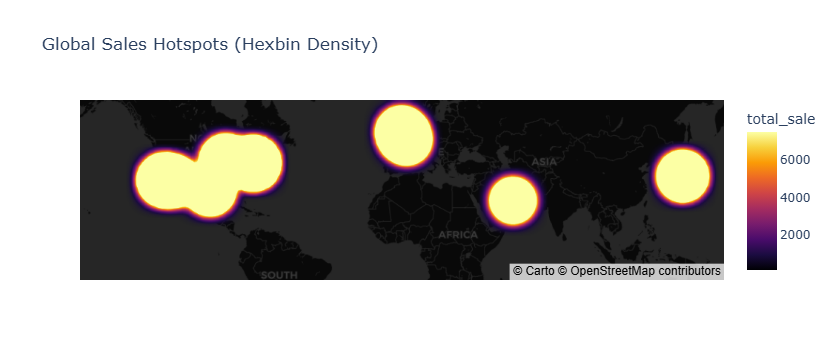

In [25]:
#Hexagonal Binning Geo Map (Hexbin Map) 
import plotly.express as px

# We need city coordinates from the previous step
city_coords = {
    'New York': {'lat': 40.7128, 'lon': -74.0060}, 'Los Angeles': {'lat': 34.0522, 'lon': -118.2437},
    'Chicago': {'lat': 41.8781, 'lon': -87.6298}, 'Houston': {'lat': 29.7604, 'lon': -95.3698},
    'Phoenix': {'lat': 33.4484, 'lon': -112.0740}, 'London': {'lat': 51.5074, 'lon': -0.1278},
    'Tokyo': {'lat': 35.6895, 'lon': 139.6917}, 'Paris': {'lat': 48.8566, 'lon': 2.3522},
    'Sydney': {'lat': -33.8688, 'lon': 151.2093}, 'Dubai': {'lat': 25.2048, 'lon': 55.2708}
}
df['lat'] = df['location'].map(lambda x: city_coords[x]['lat'])
df['lon'] = df['location'].map(lambda x: city_coords[x]['lon'])

fig = px.density_mapbox(
    df,
    lat='lat',
    lon='lon',
    z='total_sale',
    radius=30,
    center=dict(lat=30, lon=0),
    zoom=0.5,
    mapbox_style="carto-darkmatter",
    color_continuous_scale="Inferno",
    title='Global Sales Hotspots (Hexbin Density)'
)
fig.show()

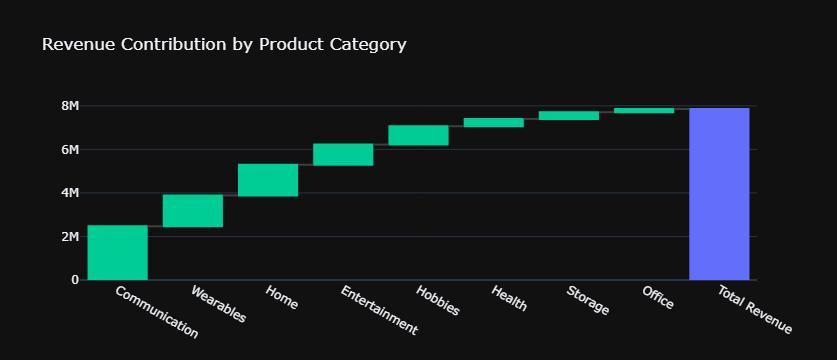

In [26]:
#Waterfall Chart for Revenue Breakdown
# Prepare data
category_revenue = df.groupby('category')['total_sale'].sum().sort_values(ascending=False)
total_revenue = category_revenue.sum()

# Create the waterfall chart
fig = go.Figure(go.Waterfall(
    name="Revenue",
    orientation="v",
    measure=["relative"] * len(category_revenue) + ["total"],
    x=list(category_revenue.index) + ["Total Revenue"],
    y=list(category_revenue.values) + [total_revenue],
    connector={"line": {"color": "rgb(63, 63, 63)"}},
    increasing={"marker": {"color": "#00CC96"}},
    decreasing={"marker": {"color": "#EF553B"}},
    totals={"marker": {"color": "#636EFA"}}
))

fig.update_layout(
    title="Revenue Contribution by Product Category",
    showlegend=False,
    template='plotly_dark'
)
fig.show()

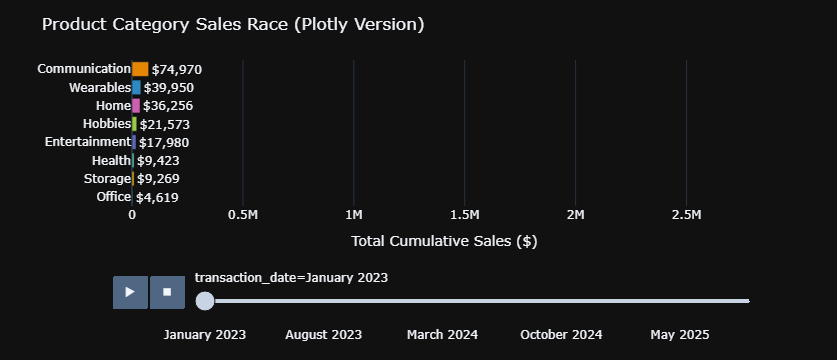

In [4]:
import plotly.express as px

# 1. Use the same monthly sales data you already prepared
monthly_category_sales = df.groupby([pd.Grouper(key='transaction_date', freq='M'), 'category'])['total_sale'].sum().unstack(fill_value=0).cumsum()

# 2. Transform the data from wide format to long format, which Plotly prefers
sales_long = monthly_category_sales.reset_index().melt(
    id_vars='transaction_date', 
    var_name='category', 
    value_name='sales'
)
sales_long['transaction_date'] = sales_long['transaction_date'].dt.strftime('%B %Y')

# 3. Create the animated bar chart with Plotly Express
fig = px.bar(
    sales_long,
    x='sales',
    y='category',
    orientation='h',
    animation_frame='transaction_date',
    animation_group='category',
    color='category',
    color_discrete_sequence=px.colors.qualitative.Vivid,
    text='sales'
)

# 4. Improve the animation and layout for a "racing" effect
fig.update_layout(
    title='Product Category Sales Race (Plotly Version)',
    xaxis_title='Total Cumulative Sales ($)',
    yaxis_title='',
    template='plotly_dark',
    showlegend=False,
    # Fix the x-axis range to prevent it from resizing on every frame
    xaxis_range=[0, monthly_category_sales.max().max() * 1.1]
)

# This crucial line sorts the bars in each frame to create the "race"
fig.update_yaxes(categoryorder="total ascending")

# Format the text on the bars
fig.update_traces(texttemplate='$%{x:,.0f}', textposition='outside')

# Control the animation speed
fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 200
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 50

fig.show()

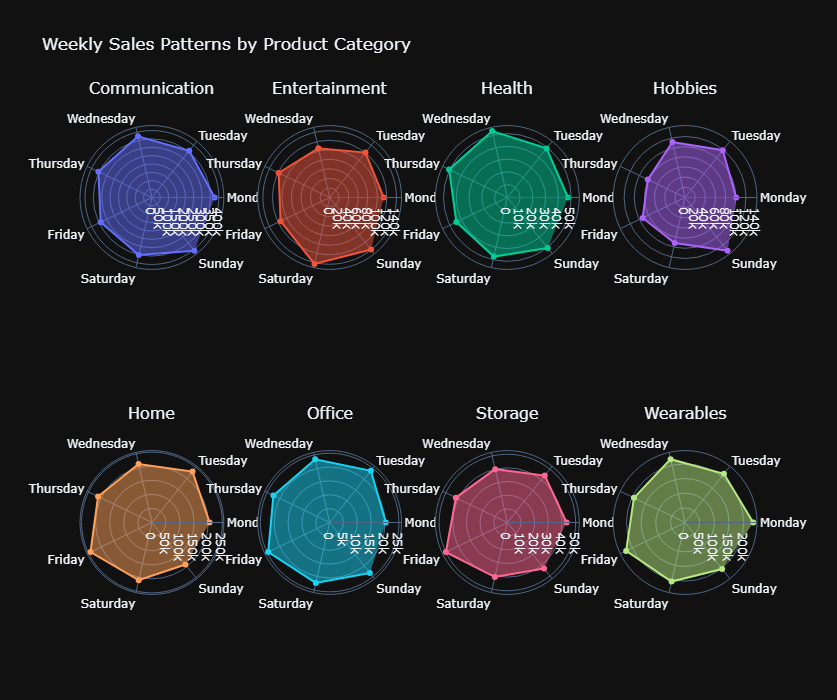

In [5]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import math

# 1. Prepare data (ensure days are in order)
day_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
df['day_of_week'] = pd.Categorical(df['transaction_date'].dt.day_name(), categories=day_order, ordered=True)
sales_by_day_cat = df.groupby(['category', 'day_of_week'], observed=False)['total_sale'].sum().reset_index()

# 2. Set up the subplot grid
categories = sales_by_day_cat['category'].unique()
num_categories = len(categories)
cols = 4 # Define number of columns
rows = math.ceil(num_categories / cols) # Calculate required rows

fig = make_subplots(
    rows=rows,
    cols=cols,
    specs=[[{'type': 'polar'}] * cols] * rows, # Specify each cell is a polar chart
    subplot_titles=categories
)

# 3. Loop through each category and add its polar chart to the grid
for i, category in enumerate(categories):
    row = (i // cols) + 1
    col = (i % cols) + 1
    
    category_data = sales_by_day_cat[sales_by_day_cat['category'] == category]
    
    fig.add_trace(
        go.Scatterpolar(
            r=category_data['total_sale'],
            theta=category_data['day_of_week'],
            fill='toself',
            name=category
        ),
        row=row,
        col=col
    )

# 4. Update the overall layout
fig.update_layout(
    title_text="Weekly Sales Patterns by Product Category",
    template='plotly_dark',
    height=350 * rows, # Adjust height based on number of rows
    showlegend=False
)

fig.show()

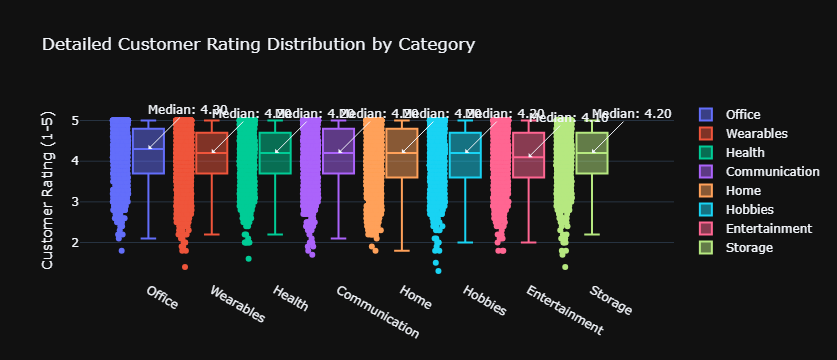

In [31]:
#Advanced Box Plot with Strip and Annotations 
fig = go.Figure()
categories = df['category'].unique()

for cat in categories:
    fig.add_trace(go.Box(
        y=df[df['category']==cat]['customer_rating'],
        name=cat,
        boxpoints='all', # Show all points
        jitter=0.5,      # Add jitter to spread them out
        pointpos=-1.8
    ))

# Add annotations for median values
medians = df.groupby('category')['customer_rating'].median()
for cat, median_val in medians.items():
    fig.add_annotation(
        x=cat, y=median_val,
        text=f'Median: {median_val:.2f}',
        showarrow=True, arrowhead=1,
        ax=40, ay=-40
    )

fig.update_layout(
    title='Detailed Customer Rating Distribution by Category',
    yaxis_title='Customer Rating (1-5)',
    template='plotly_dark'
)
fig.show()

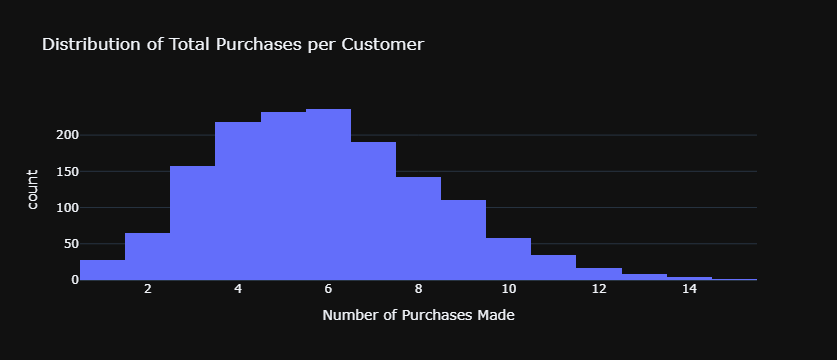

In [36]:
import plotly.express as px

transaction_counts = df['customer_id'].value_counts().reset_index()
transaction_counts.columns = ['customer_id', 'num_transactions']

fig = px.histogram(
    transaction_counts,
    x='num_transactions',
    nbins=20,
    title='Distribution of Total Purchases per Customer',
    labels={'num_transactions': 'Number of Purchases Made', 'count': 'Number of Customers'},
    template='plotly_dark'
)
fig.show()

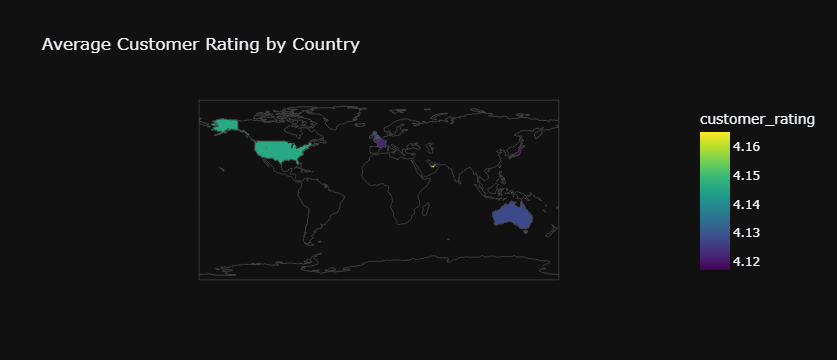

In [13]:
#Geographic Heatmap of Average Customer Rating

import plotly.express as px

# 1. Calculate average rating per location
location_ratings = df.groupby('location')['customer_rating'].mean().reset_index()

# 2. Add ISO country codes for plotting
iso_map = {'New York': 'USA', 'Los Angeles': 'USA', 'Chicago': 'USA', 'Houston': 'USA', 'Phoenix': 'USA',
           'London': 'GBR', 'Tokyo': 'JPN', 'Paris': 'FRA', 'Sydney': 'AUS', 'Dubai': 'ARE'}
location_ratings['iso_alpha'] = location_ratings['location'].map(iso_map)
country_ratings = location_ratings.groupby('iso_alpha')['customer_rating'].mean().reset_index()

# 3. Create the choropleth map
fig = px.choropleth(
    country_ratings,
    locations="iso_alpha",
    color="customer_rating",
    hover_name="iso_alpha",
    color_continuous_scale=px.colors.sequential.Viridis,
    title="Average Customer Rating by Country",
    template='plotly_dark'
)
fig.show()

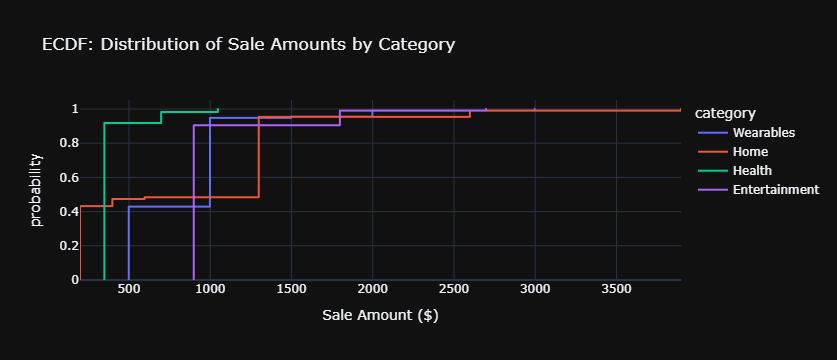

In [14]:
#Sales Heatmap: Day of Week vs. Product Category
import plotly.express as px

# 1. We can use the main 'df' DataFrame directly
# Let's visualize for a few key categories for clarity
categories_to_plot = ['Wearables', 'Entertainment', 'Home', 'Health']
df_subset = df[df['category'].isin(categories_to_plot)]

# 2. Create the ECDF plot
fig = px.ecdf(
    df_subset,
    x="total_sale",
    color="category",
    title="ECDF: Distribution of Sale Amounts by Category",
    labels={'total_sale': 'Sale Amount ($)'},
    template='plotly_dark'
)
fig.show()

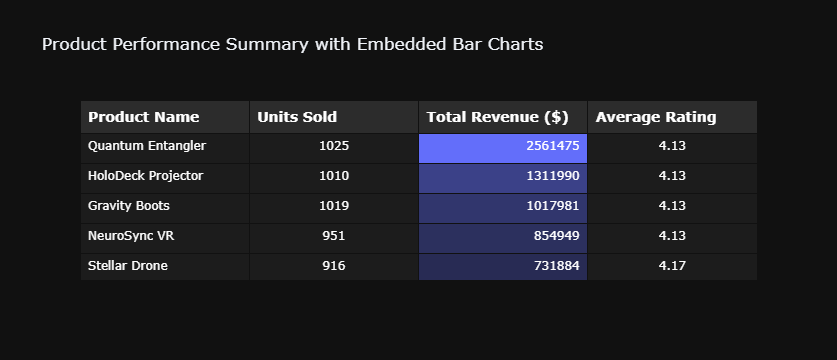

In [15]:
#Interactive Table with Embedded Bar Charts
import plotly.graph_objects as go

# 1. Create a product summary table
product_summary = df.groupby('product_name').agg(
    units_sold=('quantity', 'sum'),
    total_revenue=('total_sale', 'sum'),
    avg_rating=('customer_rating', 'mean')
).reset_index().sort_values('total_revenue', ascending=False)

# 2. Create the table with embedded graphics
fig = go.Figure(data=[go.Table(
    header=dict(values=['<b>Product Name</b>', '<b>Units Sold</b>', '<b>Total Revenue ($)</b>', '<b>Average Rating</b>'],
                fill_color='#2c2c2c',
                align='left',
                font=dict(color='white', size=14)),
    cells=dict(
        values=[
            product_summary['product_name'],
            product_summary['units_sold'],
            product_summary['total_revenue'],
            product_summary['avg_rating'].round(2)
        ],
        # Add bar charts to the 'Total Revenue' column
        fill_color=[
            '#1c1c1c', # Column 1 color
            '#1c1c1c', # Column 2 color
            # Create a color gradient for the revenue column based on its value
            [f'rgba(99, 110, 250, {val / product_summary.total_revenue.max()})' for val in product_summary.total_revenue],
            '#1c1c1c'  # Column 4 color
        ],
        align=['left', 'center', 'right', 'center'],
        font=dict(color='white', size=12),
        height=30
    )
)])

fig.update_layout(
    title='Product Performance Summary with Embedded Bar Charts',
    template='plotly_dark'
)
fig.show()

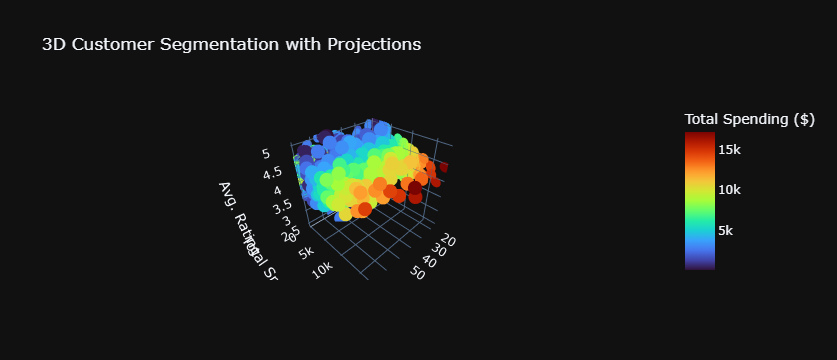

In [16]:
#3D Scatter Plot with Projection Lines
import plotly.express as px

# 1. Create a summary of customer data
customer_summary = df.groupby('customer_id').agg(
    total_spent=('total_sale', 'sum'),
    avg_rating=('customer_rating', 'mean'),
    age=('age', 'first')
).reset_index().sample(500) # Sample for better performance

# 2. Create the 3D scatter plot
fig = px.scatter_3d(
    customer_summary,
    x='age',
    y='total_spent',
    z='avg_rating',
    color='total_spent',
    color_continuous_scale='Turbo',
    title='3D Customer Segmentation with Projections',
    template='plotly_dark',
    labels={'total_spent': 'Total Spending ($)', 'avg_rating': 'Avg. Rating'}
)

# 3. Add projection lines to the 'floor' planes
fig.update_traces(projection_x_show=True,
                  projection_y_show=True)

fig.show()

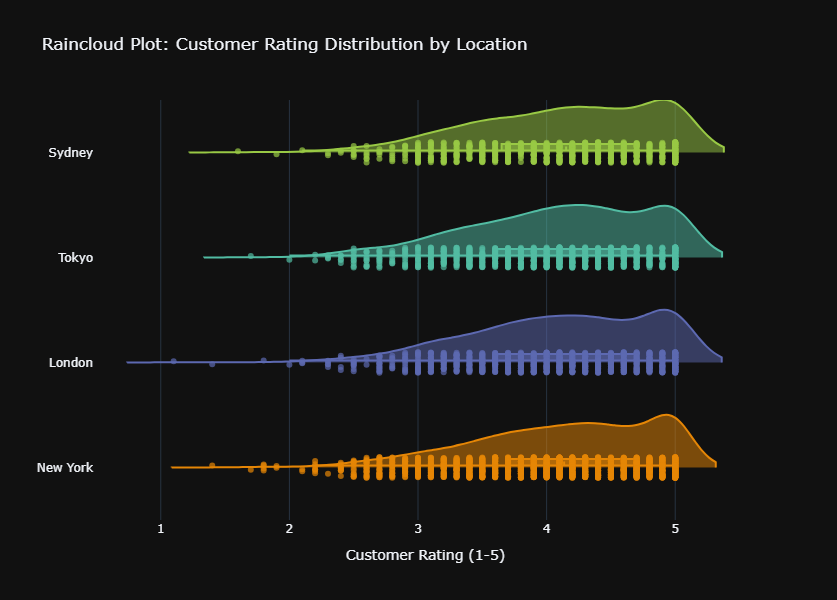

In [26]:
# Raincloud Plot
import plotly.graph_objects as go
import plotly.express as px
import numpy as np

# 1. We will compare customer ratings across different locations
locations_to_plot = ['New York', 'London', 'Tokyo', 'Sydney']
df_subset = df[df['location'].isin(locations_to_plot)]

# 2. Create the figure
fig = go.Figure()
colors = px.colors.qualitative.Vivid

# 3. Loop through locations to create the raincloud components
for i, location in enumerate(locations_to_plot):
    location_data = df_subset[df_subset['location'] == location]['customer_rating']
    
    # --- Component 1: Half-Violin (The "Cloud" with embedded box plot) ---
    fig.add_trace(go.Violin(
        x=location_data,
        name=location,
        line_color=colors[i],
        side='positive',
        orientation='h',
        points=False,         # Hide raw points on the violin
        box_visible=True,     # Show a box plot inside the violin
        meanline_visible=True,# Show the mean line
        showlegend=False
    ))

    # --- Component 2: Jittered Points (The "Rain") ---
    # We use a Box trace but make the box itself invisible, showing only the points.
    fig.add_trace(go.Box(
        x=location_data,
        name=location,
        boxpoints='all',      # Show all the points
        jitter=0.4,           # Add jitter to spread them out
        pointpos=0,
        marker_color=colors[i],
        marker_opacity=0.7,
        line_width=0,         # Make the box outline invisible
        fillcolor='rgba(0,0,0,0)', # Make the box fill transparent
        orientation='h',
        showlegend=False
    ))

# 4. Update the overall layout
fig.update_layout(
    title="Raincloud Plot: Customer Rating Distribution by Location",
    xaxis_title="Customer Rating (1-5)",
    yaxis_title="",
    template='plotly_dark',
    height=600,
    # Overlay the violin and box plots correctly for each category
    violingap=0, violingroupgap=0, violinmode='overlay'
)
fig.show()

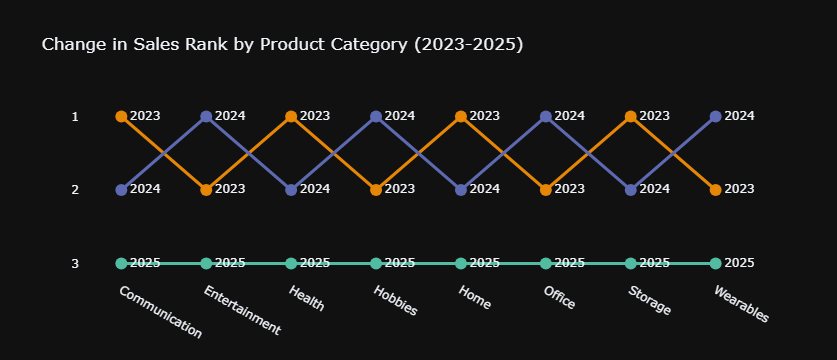

In [20]:
#Slope Chart for Year-Over-Year Ranking Changes
import plotly.graph_objects as go

# 1. Calculate sales rank for each category by year
df['year'] = df['transaction_date'].dt.year
yearly_sales = df.groupby(['year', 'category'])['total_sale'].sum().unstack(fill_value=0)
yearly_ranks = yearly_sales.rank(axis=0, method='min', ascending=False)
years = yearly_ranks.columns

# 2. Create the figure
fig = go.Figure()
colors = px.colors.qualitative.Vivid

# 3. Add lines and markers for each category
for i, category in enumerate(yearly_ranks.index):
    fig.add_trace(go.Scatter(
        x=years,
        y=yearly_ranks.loc[category],
        mode='lines+markers+text',
        name=category,
        line=dict(color=colors[i], width=3),
        marker=dict(size=12),
        text=category,
        textposition="middle right"
    ))

# 4. Clean up the layout for a minimalist "slope chart" look
fig.update_layout(
    title="Change in Sales Rank by Product Category (2023-2025)",
    template='plotly_dark',
    showlegend=False,
    yaxis=dict(
        autorange="reversed", # Rank 1 should be at the top
        zeroline=False,
        showgrid=False,
        tickvals=list(range(1, len(yearly_ranks.index) + 1))
    ),
    xaxis=dict(
        showgrid=False,
        tickvals=years
    )
)
fig.show()

In [23]:
import pandas as pd
import numpy as np
import datetime

# --- Configuration ---
NUM_CUSTOMERS = 1500
NUM_PRODUCTS = 10
NUM_TRANSACTIONS = 8000 # Reduced slightly to account for multi-item transactions
START_DATE = datetime.date(2023, 1, 1)
END_DATE = datetime.date(2025, 9, 15)

# --- Data Dictionaries (same as before) ---
products_df = pd.DataFrame({
    'product_id': [f'QG{101+i}' for i in range(NUM_PRODUCTS)],
    'product_name': ['ChronoLeap Watch', 'NeuroSync VR', 'HoloDeck Projector', 'Quantum Entangler',
                     'Bio-Harmonizer', 'Stellar Drone', 'EchoSphere Speaker', 'Plasma Scribe Pen',
                     'Stealth Drive', 'Gravity Boots'],
    'category': ['Wearables', 'Entertainment', 'Home', 'Communication', 'Health', 'Hobbies', 'Home', 'Office', 'Storage', 'Wearables'],
    'base_price': [499, 899, 1299, 2499, 349, 799, 199, 149, 299, 999]
})
customers_df = pd.DataFrame({
    'customer_id': [1001 + i for i in range(NUM_CUSTOMERS)],
    'age': np.random.randint(18, 70, size=NUM_CUSTOMERS),
    'gender': np.random.choice(['Male', 'Female', 'Non-binary'], size=NUM_CUSTOMERS, p=[0.48, 0.48, 0.04]),
    'location': np.random.choice(['New York', 'Los Angeles', 'Chicago', 'Houston', 'Phoenix', 'London', 'Tokyo', 'Paris', 'Sydney', 'Dubai'],
                                 size=NUM_CUSTOMERS, p=[0.2, 0.15, 0.1, 0.08, 0.07, 0.1, 0.1, 0.08, 0.07, 0.05]),
    'join_date': [START_DATE + datetime.timedelta(days=np.random.randint(0, (END_DATE - START_DATE).days)) for _ in range(NUM_CUSTOMERS)]
})

# --- NEW LOGIC: Generate Transactions with Multi-Item Baskets ---
transactions = []
transaction_counter = 20001
current_transaction = 0

while current_transaction < NUM_TRANSACTIONS:
    cust_id = np.random.choice(customers_df['customer_id'])
    
    # Generate a random date for the entire transaction
    month = np.random.choice(range(1, 13), p=[0.07, 0.07, 0.07, 0.08, 0.08, 0.08, 0.08, 0.09, 0.09, 0.11, 0.1, 0.08])
    day = np.random.randint(1, 29)
    year = np.random.randint(2023, 2026)
    try:
        transaction_date = datetime.date(year, month, day)
    except ValueError:
        transaction_date = datetime.date(year, month, 28)
    if not (START_DATE <= transaction_date <= END_DATE):
        continue

    # Decide if it's a multi-item purchase (e.g., 30% chance)
    if np.random.rand() < 0.3:
        num_items = np.random.choice([2, 3], p=[0.8, 0.2])
        products_in_basket = np.random.choice(products_df['product_id'], size=num_items, replace=False)
    else:
        num_items = 1
        products_in_basket = [np.random.choice(products_df['product_id'])]

    # Create a record for each item in the basket with the same transaction_id
    for prod_id in products_in_basket:
        transactions.append({
            'transaction_id': f'T{transaction_counter}',
            'customer_id': cust_id,
            'product_id': prod_id,
            'quantity': 1, # Keep quantity 1 for basket analysis
            'transaction_date': transaction_date,
            'customer_rating': round(max(1, min(5, np.random.normal(4.2, 0.8))), 1)
        })
    
    transaction_counter += 1
    current_transaction += 1
    
transactions_df = pd.DataFrame(transactions)

# --- Merge into a single DataFrame (same as before) ---
df = pd.merge(transactions_df, customers_df, on='customer_id')
df = pd.merge(df, products_df, on='product_id')
df['total_sale'] = df['quantity'] * df['base_price']
df['transaction_date'] = pd.to_datetime(df['transaction_date'])

print("New, richer synthetic data generated successfully!")
print(f"DataFrame shape: {df.shape}")
df.head()

New, richer synthetic data generated successfully!
DataFrame shape: (10843, 14)


,transaction_id,customer_id,product_id,quantity,transaction_date,customer_rating,age,gender,location,join_date,product_name,category,base_price,total_sale
0,T20001,1002,QG107,1,2023-11-10,4.4,55,Female,London,2024-03-15,EchoSphere Speaker,Home,199,199
1,T27147,2038,QG107,1,2025-07-25,3.0,54,Male,Sydney,2023-03-10,EchoSphere Speaker,Home,199,199
2,T20003,1841,QG107,1,2024-02-12,4.8,65,Male,London,2024-04-28,EchoSphere Speaker,Home,199,199
3,T20471,1688,QG107,1,2023-01-19,4.3,24,Female,Tokyo,2024-04-08,EchoSphere Speaker,Home,199,199
4,T27104,1775,QG107,1,2023-02-13,3.0,35,Male,Los Angeles,2024-07-22,EchoSphere Speaker,Home,199,199


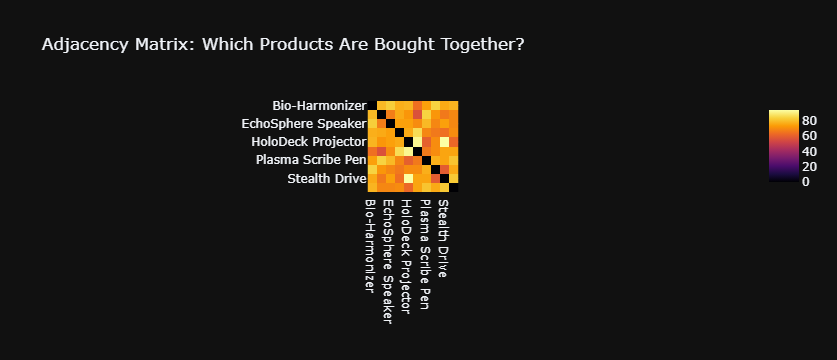

In [24]:
#Adjacency Matrix 

import pandas as pd
import plotly.express as px
from itertools import combinations

# 1. Find pairs of products bought together and count them
baskets = df.groupby('transaction_id')['product_name'].apply(list).reset_index()
baskets = baskets[baskets['product_name'].map(len) > 1]
edges = baskets['product_name'].apply(lambda x: list(combinations(sorted(x), 2))).explode().dropna()
edge_counts = edges.value_counts()

# 2. Check if any co-purchases exist
if not edge_counts.empty:
    # --- FIX IS HERE: Convert the index to a MultiIndex before unstacking ---
    new_index = pd.MultiIndex.from_tuples(edge_counts.index, names=['product_1', 'product_2'])
    edge_counts_multi = pd.Series(edge_counts.values, index=new_index)
    adjacency_df = edge_counts_multi.unstack(fill_value=0)
    # --------------------------------------------------------------------

    # 3. Create a full, symmetric adjacency matrix
    product_names = sorted(df['product_name'].unique())
    adjacency_df = adjacency_df.reindex(index=product_names, columns=product_names, fill_value=0)
    adjacency_matrix = adjacency_df + adjacency_df.T
    
    # Set diagonal to 0 as a product can't co-occur with itself in this context
    np.fill_diagonal(adjacency_matrix.values, 0)

    # 4. Create the heatmap
    fig = px.imshow(
        adjacency_matrix,
        color_continuous_scale='Inferno',
        title="Adjacency Matrix: Which Products Are Bought Together?"
    )
    fig.update_layout(template='plotly_dark', xaxis_title="", yaxis_title="")
    fig.show()

else:
    # This part runs if no multi-item transactions were found
    print("Could not generate the adjacency matrix: No transactions with multiple items found.")
    fig = go.Figure()
    fig.update_layout(
        title='Adjacency Matrix',
        template='plotly_dark',
        xaxis={'showgrid': False, 'zeroline': False, 'showticklabels': False},
        yaxis={'showgrid': False, 'zeroline': False, 'showticklabels': False},
        annotations=[dict(text="No data available to create this chart.",
                          xref="paper", yref="paper", showarrow=False, font=dict(size=16))]
    )
    fig.show()

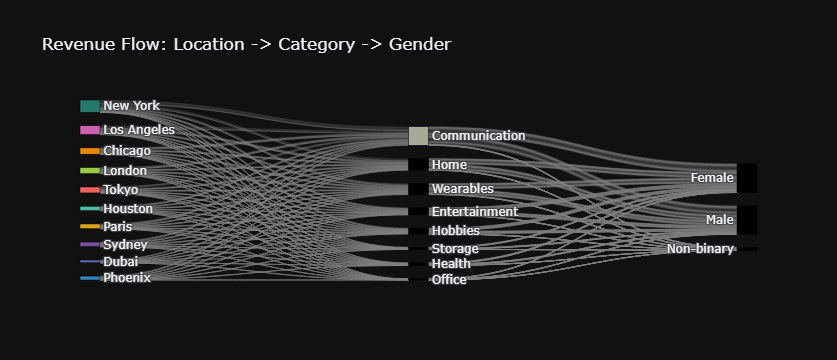

In [29]:
# Multi-Level Sankey Diagram of Revenue Flow
import plotly.graph_objects as go
import pandas as pd

# 1. Aggregate data for the flow
sankey_data = df.groupby(['location', 'category', 'gender'])['total_sale'].sum().reset_index()

# 2. Prepare nodes and links for the diagram
label_list = list(pd.concat([sankey_data['location'], sankey_data['category'], sankey_data['gender']]).unique())
source_indices = sankey_data['location'].map(label_list.index).tolist() + \
                 sankey_data['category'].map(label_list.index).tolist()
target_indices = sankey_data['category'].map(label_list.index).tolist() + \
                 sankey_data['gender'].map(label_list.index).tolist()
values = sankey_data['total_sale'].tolist() * 2

# 3. Create the Sankey figure
fig = go.Figure(data=[go.Sankey(
    node=dict(
      pad=25,
      thickness=20,
      line=dict(color="black", width=0.5),
      label=label_list,
      color=px.colors.qualitative.Vivid
    ),
    link=dict(
      source=source_indices,
      target=target_indices,
      value=values,
      color='rgba(128,128,128,0.3)'
    ))])

fig.update_layout(title_text="Revenue Flow: Location -> Category -> Gender", template='plotly_dark')
fig.show()

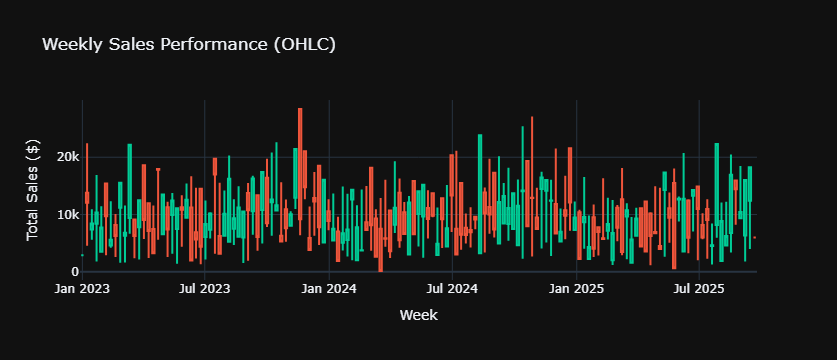

In [31]:
#Candlestick Chart 
import plotly.graph_objects as go

# 1. Resample daily sales data into weekly OHLC (Open, High, Low, Close) format
# daily_sales is a pandas Series
daily_sales = df.groupby('transaction_date')['total_sale'].sum()
weekly_ohlc = daily_sales.resample('W').ohlc()

# 2. Create the candlestick chart
fig = go.Figure(data=[go.Candlestick(
    x=weekly_ohlc.index,
    # --- FIX IS ON THE LINES BELOW (using simple column names) ---
    open=weekly_ohlc['open'],
    high=weekly_ohlc['high'],
    low=weekly_ohlc['low'],
    close=weekly_ohlc['close'],
    increasing_line_color='#00CC96',
    decreasing_line_color='#EF553B'
)])

# 3. Update layout
fig.update_layout(
    title='Weekly Sales Performance (OHLC)',
    xaxis_title='Week',
    yaxis_title='Total Sales ($)',
    template='plotly_dark',
    xaxis_rangeslider_visible=False
)
fig.show()

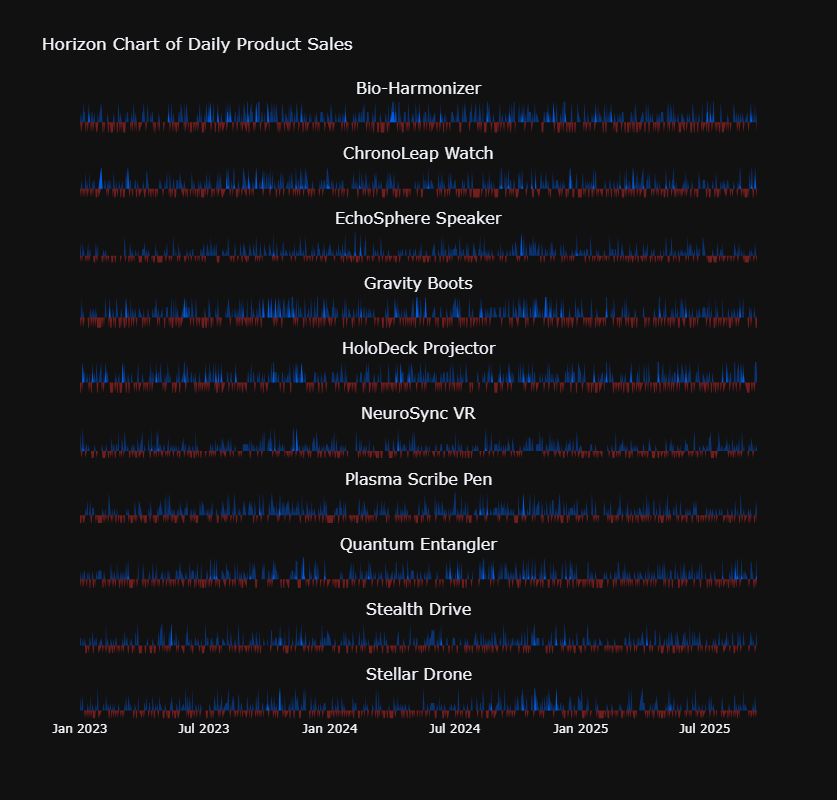

In [33]:
#Horizon Chart for Product Sales Time Series
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

# 1. Prepare data: pivot daily sales for each product
daily_product_sales = df.pivot_table(
    index='transaction_date', 
    columns='product_name', 
    values='total_sale', 
    aggfunc='sum'
).fillna(0)

# 2. Set up the subplot grid, one row per product
products = daily_product_sales.columns
fig = make_subplots(rows=len(products), cols=1, shared_xaxes=True, subplot_titles=products)

# 3. Define the bands and colors for the horizon effect
num_bands = 2
pos_colors = ['rgba(0, 102, 255, 0.4)', 'rgba(0, 102, 255, 0.8)']
neg_colors = ['rgba(255, 51, 51, 0.4)', 'rgba(255, 51, 51, 0.8)']

# 4. Loop through each product to create its horizon chart
for i, product in enumerate(products):
    series = daily_product_sales[product]
    baseline = series.median()
    band_height = (series.max() - baseline) / num_bands if (series.max() - baseline) > 0 else 1
    
    # Create positive bands (above baseline)
    for j in range(num_bands):
        fig.add_trace(go.Scatter(
            x=series.index,
            y=np.maximum(0, np.minimum(series - (baseline + j * band_height), band_height)),
            mode='lines', fill='tozeroy', line_width=0,
            fillcolor=pos_colors[j], showlegend=False
        ), row=i+1, col=1)

    # Create negative bands (below baseline)
    for j in range(num_bands):
        fig.add_trace(go.Scatter(
            x=series.index,
            y=np.minimum(0, np.maximum(series - (baseline - j * band_height), -band_height)),
            mode='lines', fill='tozeroy', line_width=0,
            fillcolor=neg_colors[j], showlegend=False
        ), row=i+1, col=1)

# 5. Update layout for a clean, modern look
fig.update_layout(
    title='Horizon Chart of Daily Product Sales',
    template='plotly_dark',
    height=80 * len(products) # Adjust height based on number of products
)
# Clean up axes for all subplots
fig.update_yaxes(showticklabels=False, showgrid=False, zeroline=False)
fig.update_xaxes(showgrid=False)
fig.show()

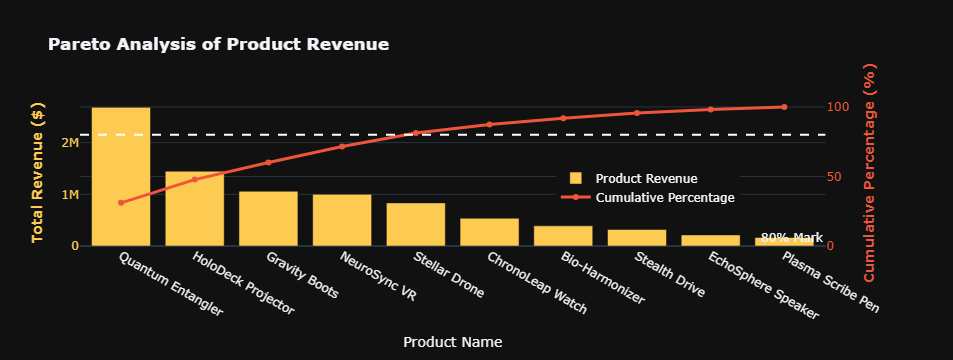

In [40]:
#Pareto Chart for Product Revenue
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1. Prepare the data
product_revenue = df.groupby('product_name')['total_sale'].sum().sort_values(ascending=False).reset_index()
product_revenue['cumulative_pct'] = 100 * product_revenue['total_sale'].cumsum() / product_revenue['total_sale'].sum()

# 2. Create a figure with a secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# 3. Add the Bar Chart for individual revenue
fig.add_trace(
    go.Bar(
        x=product_revenue['product_name'],
        y=product_revenue['total_sale'],
        name='Product Revenue',
        marker_color='#FECB52'
    ),
    secondary_y=False,
)

# 4. Add the Line Chart for cumulative percentage
fig.add_trace(
    go.Scatter(
        x=product_revenue['product_name'],
        y=product_revenue['cumulative_pct'],
        name='Cumulative Percentage',
        mode='lines+markers',
        line=dict(color='#EF553B', width=3)
    ),
    secondary_y=True,
)

# 5. Update layout and axes
fig.update_layout(
    title_text="<b>Pareto Analysis of Product Revenue</b>",
    template='plotly_dark',
    xaxis=dict(title='Product Name'),
    yaxis=dict(title='<b>Total Revenue ($)</b>', color='#FECB52'),
    yaxis2=dict(title='<b>Cumulative Percentage (%)</b>', range=[0, 105], color='#EF553B'),
    legend=dict(x=0.6, y=0.4)
)
# Add an 80% line for reference
fig.add_hline(y=80, line_dash="dash", line_color="white", secondary_y=True, annotation_text="80% Mark")
fig.show()

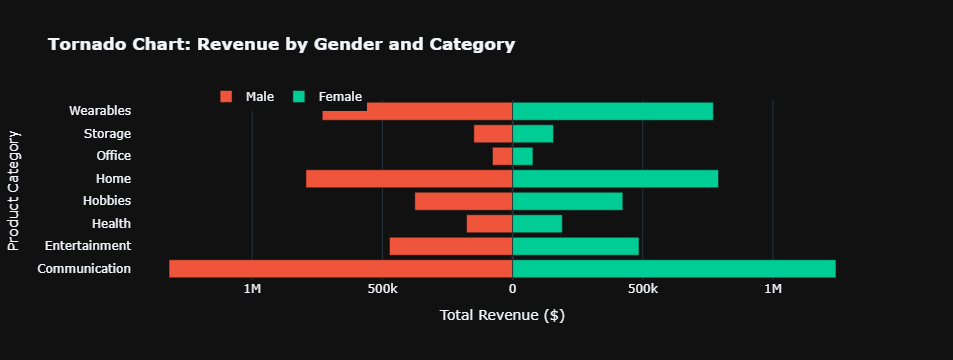

In [43]:
3Tornado Chart of Sales by Gender
import plotly.graph_objects as go
import pandas as pd

# 1. Prepare data by pivoting sales by category and gender
gender_sales = df[df['gender'].isin(['Male', 'Female'])].pivot_table(
    values='total_sale',
    index='category',
    columns='gender',
    aggfunc='sum'
).reset_index()

# 2. Multiply sales for one group by -1 to create the back-to-back effect
gender_sales['Male'] = -1 * gender_sales['Male']

# 3. Create the figure and add traces for each gender
fig = go.Figure()
fig.add_trace(go.Bar(
    y=gender_sales['category'],
    x=gender_sales['Male'],
    name='Male',
    orientation='h',
    marker_color='#EF553B',
    hovertemplate='Revenue: $%{x:,.0f}<extra></extra>'
))
fig.add_trace(go.Bar(
    y=gender_sales['category'],
    x=gender_sales['Female'],
    name='Female',
    orientation='h',
    marker_color='#00CC96',
    hovertemplate='Revenue: $%{x:,.0f}<extra></extra>'
))

# 4. Update the layout for a clean tornado chart look
fig.update_layout(
    title='<b>Tornado Chart: Revenue by Gender and Category</b>',
    template='plotly_dark',
    barmode='relative', # This makes the bars originate from the center
    yaxis_title='Product Category',
    xaxis_title='Total Revenue ($)',
    # Customize x-axis ticks to show positive values on the negative side
    xaxis=dict(
        tickvals=[-1500000, -1000000, -500000, 0, 500000, 1000000, 1500000],
        ticktext=['1.5M', '1M', '500k', '0', '500k', '1M', '1.5M']
    ),
    legend=dict(x=0.1, y=1.1, orientation='h')
)
fig.show()

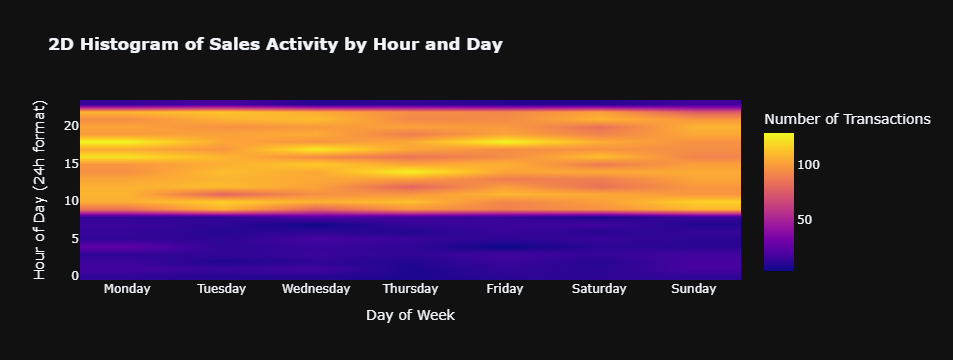

In [44]:
#2D Histogram of Sales Activity
import plotly.graph_objects as go
import numpy as np

# 1. Feature Engineering: Add a synthetic "hour of day" to our data
# Since the original data has no time, we'll create it randomly for demonstration
df['hour'] = np.random.randint(0, 24, size=len(df))
# Make sales more likely during waking hours (e.g., 9am - 10pm)
df['hour'] = df['hour'].apply(lambda x: np.random.randint(9, 23) if np.random.rand() > 0.2 else x)
df['day_of_week_name'] = df['transaction_date'].dt.day_name()

# 2. Create the 2D Histogram
fig = go.Figure(go.Histogram2d(
    x=df['day_of_week_name'],
    y=df['hour'],
    colorscale='Plasma',
    zsmooth='best', # Smoothes the color transitions
    colorbar=dict(title='Number of Transactions')
))

# 3. Update layout
fig.update_layout(
    title='<b>2D Histogram of Sales Activity by Hour and Day</b>',
    template='plotly_dark',
    xaxis_title='Day of Week',
    yaxis_title='Hour of Day (24h format)',
    # Ensure days of the week are in the correct order
    xaxis=dict(categoryorder='array', categoryarray=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])
)
fig.show()